# Cardiovascular Disease Risk Prediction with Neural Networks

In [87]:
#Libraries
import pandas as pd
import numpy as np

import os #Content directory

In [88]:
# Load libraries and some configurations
import pandas as pd
import numpy as np
import seaborn as sns
import unicodedata
from  functools import reduce
import re
import cufflinks as cf
import warnings
warnings.filterwarnings("ignore")
from plotly.offline import plot,iplot
import plotly.graph_objects as go
import plotly.express as px#graphs express
import matplotlib.pyplot as plt
import plotly.offline as pyo
cf.go_offline()

from sklearn import set_config
from sklearn import datasets
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, OneHotEncoder, PowerTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split, RepeatedKFold, cross_val_score, cross_validate, GridSearchCV, RandomizedSearchCV
from multiprocessing import cpu_count
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials


#define the number of visible columns in a dataframe
pd.set_option("display.max_columns",200)
#define the number of visible rows in a dataframe
pd.set_option("display.max_rows",100)

np.random.seed(123)


In [89]:
#Libraries
import os
import pandas as pd
import numpy as np

import missingno as msno #data quality

import matplotlib.colors as mcolors  # EDA
import seaborn as sns #EDA
import matplotlib.pyplot as plt #EDA
import matplotlib #EDA
import plotly.express as px #EDA
import plotly.graph_objs as go #EDA
import plotly.io as pio #EDA
from functools import reduce #outliers

In [90]:
def get_cv_scores_report_classification(estimator, X, y, n_splits): #Adjusting model classification
    cv_scores = cross_validate(
                    estimator = estimator,
                    X         = X,
                    y         = y,
                    scoring   = 'accuracy',
                    cv        = RepeatedStratifiedKFold(n_splits=n_splits, n_repeats=5, random_state=333),
                )

    accuracy_scores = cv_scores['test_score']
    mean_accuracy = accuracy_scores.mean()
    std_accuracy = accuracy_scores.std()

    # Printing the results
    print(f"Accuracy: {mean_accuracy:.4f} (+/- {2*std_accuracy:.4f})")

In [91]:
# Files in directory
uploaded_files = os.listdir('/content')

In [92]:
#DataBase
df = pd.read_csv('/content/proyecto_data.csv', error_bad_lines=False)

In [94]:
df.head(5)

,General_Health,Checkup,Exercise,Heart_Disease,Skin_Cancer,Other_Cancer,Depression,Diabetes,Arthritis,Sex,Age_Category,Height_(cm),Weight_(kg),BMI,Smoking_History,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption
0,Poor,Within the past 2 years,No,No,No,No,No,No,Yes,Female,70-74,150,32.66,14.54,Yes,0,30,16,12
1,Very Good,Within the past year,No,Yes,No,No,No,Yes,No,Female,70-74,165,77.11,28.29,No,0,30,0,4
2,Very Good,Within the past year,Yes,No,No,No,No,Yes,No,Female,60-64,163,88.45,33.47,No,4,12,3,16
3,Poor,Within the past year,Yes,Yes,No,No,No,Yes,No,Male,75-79,180,93.44,28.73,No,0,30,30,8
4,Good,Within the past year,No,No,No,No,No,No,No,Male,80+,191,88.45,24.37,Yes,0,8,4,0


In [95]:
#We count how many columns and lines it has
df.shape
#df.shape[1] columns

(308854, 19)

## Data Quality

In [96]:
#Libraries to use in data quality
import missingno as msno

In [97]:
#Functions to use in data quality
def completitud(df):
    comple=pd.DataFrame(df.isnull().sum())
    comple.reset_index(inplace=True)
    comple=comple.rename(columns={"index":"columna",0:"total"})
    comple["completitud"]=(1-comple["total"]/df.shape[0])*100
    comple=comple.sort_values(by="completitud",ascending=True)
    comple.reset_index(drop=True,inplace=True)
    return comple

def categoricas(df,col):
    result=pd.DataFrame(df[col].value_counts(1))
    if result.shape[0]>0:
        if (result[col].values[0]>.91) :
            print(f"{col} -- VARIABLE UNITARIA")
        result[col]=result[col].map(lambda x:str(round(x*100,2))+"%")
        result.reset_index(inplace=True)
        result.columns=[col+"_valores","%_aparicion"]
    return result

In [98]:
# See the type of data associated with each variable
df.dtypes

General_Health                   object
Checkup                          object
Exercise                         object
Heart_Disease                    object
Skin_Cancer                      object
Other_Cancer                     object
Depression                       object
Diabetes                         object
Arthritis                        object
Sex                              object
Age_Category                     object
Height_(cm)                       int64
Weight_(kg)                     float64
BMI                             float64
Smoking_History                  object
Alcohol_Consumption               int64
Fruit_Consumption                 int64
Green_Vegetables_Consumption      int64
FriedPotato_Consumption           int64
dtype: object

In [99]:
# See the details of categorical variables
df.describe(include = 'object')

,General_Health,Checkup,Exercise,Heart_Disease,Skin_Cancer,Other_Cancer,Depression,Diabetes,Arthritis,Sex,Age_Category,Smoking_History
count,308854,308854,308854,308854,308854,308854,308854,308854,308854,308854,308854,308854
unique,5,5,2,2,2,2,2,4,2,2,13,2
top,Very Good,Within the past year,Yes,No,No,No,No,No,No,Female,65-69,No
freq,110395,239371,239381,283883,278860,278976,246953,259141,207783,160196,33434,183590


In [100]:
# continuous variables
df.describe()

,Height_(cm),Weight_(kg),BMI,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption
count,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000
mean,170.615249,83.588655,28.626211,5.096366,29.835200,15.110441,6.296616
std,10.658026,21.343210,6.522323,8.199763,24.875735,14.926238,8.582954
min,91.000000,24.950000,12.020000,0.000000,0.000000,0.000000,0.000000
25%,163.000000,68.040000,24.210000,0.000000,12.000000,4.000000,2.000000
50%,170.000000,81.650000,27.440000,1.000000,30.000000,12.000000,4.000000
75%,178.000000,95.250000,31.850000,6.000000,30.000000,20.000000,8.000000
max,241.000000,293.020000,99.330000,30.000000,120.000000,128.000000,128.000000


In [101]:
df.columns

Index(['General_Health', 'Checkup', 'Exercise', 'Heart_Disease', 'Skin_Cancer',
       'Other_Cancer', 'Depression', 'Diabetes', 'Arthritis', 'Sex',
       'Age_Category', 'Height_(cm)', 'Weight_(kg)', 'BMI', 'Smoking_History',
       'Alcohol_Consumption', 'Fruit_Consumption',
       'Green_Vegetables_Consumption', 'FriedPotato_Consumption'],
      dtype='object')

In [102]:
#Transform variable names to lowercase
df.columns = [col.lower() for col in df.columns]

In [103]:
df.columns

Index(['general_health', 'checkup', 'exercise', 'heart_disease', 'skin_cancer',
       'other_cancer', 'depression', 'diabetes', 'arthritis', 'sex',
       'age_category', 'height_(cm)', 'weight_(kg)', 'bmi', 'smoking_history',
       'alcohol_consumption', 'fruit_consumption',
       'green_vegetables_consumption', 'friedpotato_consumption'],
      dtype='object')

In [104]:
#new_column_names = {'height_(cm)': 'height','weight_(kg)': 'weight'}
#df.rename(columns=new_column_names, inplace=True)

In [105]:
#Prefixes for variable types
#The following nomenclature will be worked on in the module
# "c_" - Numerical variables: Discrete and continuous
# "v_" - Categorical variables
# "d_" - Date type variables
# "t_" - Text variables: comments, descriptions, url
# "g_" - Geographic variables

v_feats=['general_health',"checkup", 'exercise', 'heart_disease', 'skin_cancer','other_cancer', 'depression', 'diabetes',
         'arthritis', 'sex','age_category','smoking_history' ]
c_feats=['height_(cm)', 'weight_(kg)', 'bmi','alcohol_consumption', 'fruit_consumption','green_vegetables_consumption',
         'friedpotato_consumption' ]


v_feats_new=["v_"+x for x in v_feats]
c_feats_new=["c_"+x for x in c_feats]


df.rename(columns=dict(zip(v_feats,v_feats_new)),inplace=True)
df.rename(columns=dict(zip(c_feats,c_feats_new)),inplace=True)

In [106]:
#Review and remove duplicates
#Total duplicate records in general
df.duplicated().sum()

80

In [107]:
df.drop_duplicates(inplace=True)

In [108]:
#We observe what percentage of duplicates it is
(80/len(df))*100

0.02590891720157785

In [109]:
#As it is a small percentage, we remove duplicates
df.drop_duplicates(inplace=True)

In [110]:
# Completeness
df.isnull().sum(0)

v_general_health                  0
v_checkup                         0
v_exercise                        0
v_heart_disease                   0
v_skin_cancer                     0
v_other_cancer                    0
v_depression                      0
v_diabetes                        0
v_arthritis                       0
v_sex                             0
v_age_category                    0
c_height_(cm)                     0
c_weight_(kg)                     0
c_bmi                             0
v_smoking_history                 0
c_alcohol_consumption             0
c_fruit_consumption               0
c_green_vegetables_consumption    0
c_friedpotato_consumption         0
dtype: int64

In [111]:
df = df.dropna()

In [112]:
completitud(df)

#it ​​is observed that there are none with less than 80% missing (in that case they would be eliminated)

,columna,total,completitud
0,v_general_health,0,100.0
1,c_fruit_consumption,0,100.0
2,c_alcohol_consumption,0,100.0
3,v_smoking_history,0,100.0
4,c_bmi,0,100.0
5,c_weight_(kg),0,100.0
6,c_height_(cm),0,100.0
7,v_age_category,0,100.0
8,c_green_vegetables_consumption,0,100.0
9,v_sex,0,100.0


<Axes: >

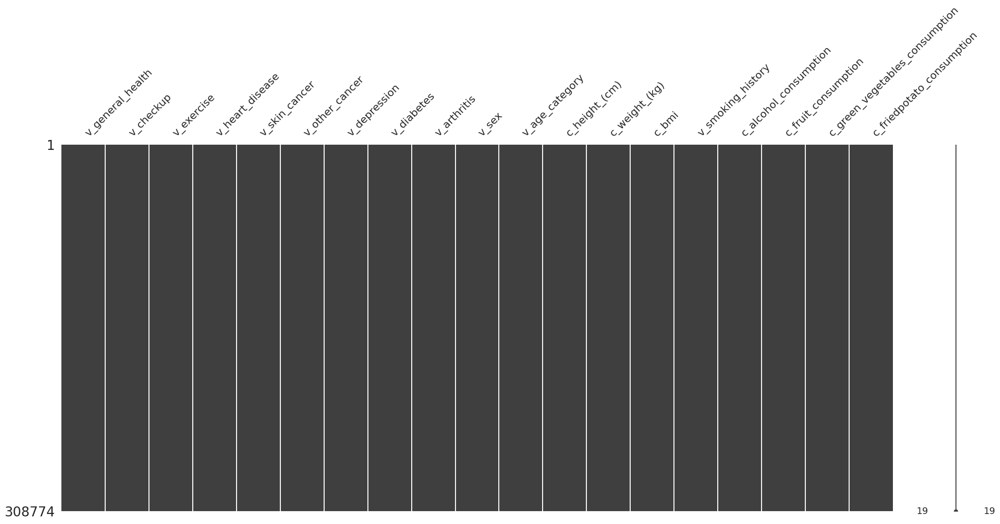

In [113]:
msno.matrix(df.iloc[:, :32])

In [114]:
##Precision/Order

for col in df.filter(like="v_").columns:
    display(categoricas(df,col))
    print("\n")

#We observe our unit variable is heart disease, however we keep it because it is our target

,v_general_health_valores,%_aparicion
0,Very Good,35.74%
1,Good,30.88%
2,Excellent,18.11%
3,Fair,11.6%
4,Poor,3.67%


,v_checkup_valores,%_aparicion
0,Within the past year,77.5%
1,Within the past 2 years,12.05%
2,Within the past 5 years,5.65%
3,5 or more years ago,4.35%
4,Never,0.46%


,v_exercise_valores,%_aparicion
0,Yes,77.5%
1,No,22.5%




v_heart_disease -- VARIABLE UNITARIA


,v_heart_disease_valores,%_aparicion
0,No,91.91%
1,Yes,8.09%


,v_skin_cancer_valores,%_aparicion
0,No,90.29%
1,Yes,9.71%


,v_other_cancer_valores,%_aparicion
0,No,90.32%
1,Yes,9.68%


,v_depression_valores,%_aparicion
0,No,79.95%
1,Yes,20.05%


,v_diabetes_valores,%_aparicion
0,No,83.9%
1,Yes,13.01%
2,"No, pre-diabetes or borderline diabetes",2.23%
3,"Yes, but female told only during pregnancy",0.86%


,v_arthritis_valores,%_aparicion
0,No,67.27%
1,Yes,32.73%


,v_sex_valores,%_aparicion
0,Female,51.87%
1,Male,48.13%


,v_age_category_valores,%_aparicion
0,65-69,10.83%
1,60-64,10.5%
2,70-74,10.07%
3,55-59,9.08%
4,50-54,8.13%
5,80+,7.21%
6,40-44,6.99%
7,45-49,6.79%
8,75-79,6.7%
9,35-39,6.67%


,v_smoking_history_valores,%_aparicion
0,No,59.43%
1,Yes,40.57%


In [115]:
##Consistency
#For consistency, we will check that the data makes sense to us by seeing the unique values ​​contained in each
#variable, seeing that yes, we now continue grouping certain categories

#We look for consistency within categorical data
unique_values_per_column = {column: df[column].unique() for column in df.columns if column.startswith('v_')}
for column, values in unique_values_per_column.items():
    print(f"Valores para {column}:{values}")

Valores para v_general_health:['Poor' 'Very Good' 'Good' 'Fair' 'Excellent']
Valores para v_checkup:['Within the past 2 years' 'Within the past year' '5 or more years ago'
 'Within the past 5 years' 'Never']
Valores para v_exercise:['No' 'Yes']
Valores para v_heart_disease:['No' 'Yes']
Valores para v_skin_cancer:['No' 'Yes']
Valores para v_other_cancer:['No' 'Yes']
Valores para v_depression:['No' 'Yes']
Valores para v_diabetes:['No' 'Yes' 'No, pre-diabetes or borderline diabetes'
 'Yes, but female told only during pregnancy']
Valores para v_arthritis:['Yes' 'No']
Valores para v_sex:['Female' 'Male']
Valores para v_age_category:['70-74' '60-64' '75-79' '80+' '65-69' '50-54' '45-49' '18-24' '30-34'
 '55-59' '35-39' '40-44' '25-29']
Valores para v_smoking_history:['Yes' 'No']


In [116]:
df.columns

Index(['v_general_health', 'v_checkup', 'v_exercise', 'v_heart_disease',
       'v_skin_cancer', 'v_other_cancer', 'v_depression', 'v_diabetes',
       'v_arthritis', 'v_sex', 'v_age_category', 'c_height_(cm)',
       'c_weight_(kg)', 'c_bmi', 'v_smoking_history', 'c_alcohol_consumption',
       'c_fruit_consumption', 'c_green_vegetables_consumption',
       'c_friedpotato_consumption'],
      dtype='object')

In [117]:
#We look for consistency within categorical data
unique_values_per_column = {column: df[column].unique() for column in df.columns if column.startswith('c_')}
for column, values in unique_values_per_column.items():
    print(f"Valores para {column}:{values}")

Valores para c_height_(cm):[150 165 163 180 191 183 175 160 168 178 152 157 188 185 170 173 155 193
 196 206 198 140 135 145 147 142 201 218 124 203 137 122 216 224 229 151
 177 164 162 156 153 169 167 172 106 190 143 171 154 176 200 146 148 158
 159 187 104 120 107 211 226 182 213  97 184 125 127 234 130 119 132 105
 166 181 186  91 174 208 149  96 197 161  94 103 221 134 144 189 100 179
 117  99 102 110 241 115 205 195 108]
Valores para c_weight_(kg):[ 32.66  77.11  88.45  93.44 154.22  69.85 108.86  72.57  91.63  74.84
  73.48  83.91 113.4   52.16 116.12  99.79  81.65 104.33  79.38  55.79
 124.74  81.19  70.31 112.49 147.42  84.82 102.06  64.41  60.78  61.23
  88.    90.72  49.9   85.28 120.2   69.4   62.14  65.77  89.81  66.68
  86.18  72.12  87.54  62.6   75.75  88.9   92.08  56.7   68.04  79.83
  63.5   58.97 114.76  45.36  73.94  54.43 125.19  77.56  96.16  95.25
 115.67  82.55 136.08  78.93  70.76  95.71  53.52  87.09  55.34  83.01
 123.38  98.88  73.03  76.66  97.52  71.67  83

In [118]:
#We observe the values of v_diabetes:['No' 'Yes' 'No, pre-diabetes or borderline diabetes','Yes, but female told only during pregnancy']
#we will change these last two to prediabetes and yes respectively

df['v_diabetes'].replace({'No, pre-diabetes or borderline diabetes': 'Prediabetes',
    'Yes, but female told only during pregnancy': 'Yes'}, inplace=True)

In [119]:
##Conclusion

#It was identified that there were 80 duplicates in the table, which were eliminated because they represented only the
#.0259% of the information. Completeness was checked to verify the percentage of non-null or empty values ​​of each variable.
#to eliminate those that did not have a good completeness index. We observed all the variables had 100%
#being thus complete. In precision and order, unitary variables were identified, which indicate that a predominant
#certain value within the variable and would not subsequently contribute to a model, they are generally eliminated, however when
#be our target variable, it remains. For consistency, we checked that the data made sense to us and we standardized
#v_diabetes values, grouping two categories and changing the name of another to avoid confusion.

## Exploratory Analysis

In [120]:
!pip install upgrade paramiko

ERROR: Could not find a version that satisfies the requirement upgrade (from versions: none)
ERROR: No matching distribution found for upgrade


In [121]:
#Libraries to use in exploratory analysis


import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import cufflinks as cf
import plotly.graph_objects as go
import plotly.offline as pyo
import seaborn as sns
import matplotlib.colors as mcolors
import plotly.express as px



In [122]:
#Functions to use in exploratory analysis

def histogram(df, col, bins, title, xaxis_title=None, yaxis_title=None):
    layout = go.Layout( font_family="Helvetica, monospace", font_color="black", title_text=title, title_font_size=30,
        title_x=0.5, title_y=0.95,
        xaxis={"title": {"text": xaxis_title, "font": {"family": 'Helvetica, monospace', "size": 18, "color": 'black'}},
            "tickfont": {"color": 'black'}, "showline": True, "linewidth": 1, "linecolor": "black"},
        yaxis={"title": {"text": yaxis_title, "font": {"family": 'Helvetica, monospace', "size": 18, "color": 'black'}},
            "tickfont": {"color": 'black'},"showline": True, "linewidth": 1,"linecolor": "black" },
        title_font_family="Helvetica, monospace", title_font_color="black", template="plotly_white")
    fig = go.Figure()
    fig.add_trace(go.Histogram(x=df[col], nbinsx=bins, marker=dict(color="#6B2D24")))
    fig.update_layout(layout)
    fig.update_traces(opacity=0.90, marker_line_color="black")
    pyo.init_notebook_mode(connected=True)
    pyo.iplot(fig)


def pie(df,col,title,x_title="",y_title=""):
    layout = go.Layout(template="plotly_white")
    colors = ["#6B2D24", "#B84D3E", "#EA6150", "#EEA185", "#EEA298"]
    aux=pd.DataFrame(df[col].value_counts()).reset_index().rename(columns={"index":"conteo"})
    fig=aux.iplot(kind='pie',labels="conteo",values=col,title=title,asFigure=True,theme="white")

    fig.update_traces(textfont_size=10,marker=dict(colors=colors, line=dict(color='#000000', width=2)))
    fig.update_traces(textposition='inside', textinfo='percent+label')
    fig.update_layout(font_family="Helvetica, monospace",font_color="black",title_text=title,
                      title_font_size=30,title_font_family="Helvetica, monospace",title_x=0.5,
                      title_font_color="#000000",template="plotly_white")
    return fig


def bar(df, col, title, x_title="", y_title=""):
    custom_colors = ['#6B2D24', '#B84D3E', '#EA6150', '#EEA185', '#EEA298',
                    '#F6784A', '#D47D3F', '#EAA953', '#D6A53E', '#F6D04A',
                    '#9CD62D', '#60D6A4', '#99B9D6']
    layout = go.Layout(font_family="Helvetica, monospace", font_color="black", title_text=title,
        title_font_size=30,title_x=0.5,
        xaxis={"title": {"text": x_title, "font": {"family": 'Helvetica, monospace', "size": 18, "color": 'black'}}},
        yaxis={"title": {"text": y_title, "font": {"family": 'Helvetica, monospace', "size": 18, "color": 'black'}}},
        title_font_family="Helvetica, monospace", title_font_color="black",template="plotly_white")
    aux = pd.DataFrame(df[col].value_counts()).reset_index().rename(columns={"index": "conteo"})
    trace = go.Bar(x=aux["conteo"], y=aux[col], marker_color=custom_colors) #asigna los colores
    fig = go.Figure(data=[trace], layout=layout)
    fig.update_layout(width=800)
    return fig



In [123]:
df.columns
#The histograms of the numerical variables are found in the outliers section

Index(['v_general_health', 'v_checkup', 'v_exercise', 'v_heart_disease',
       'v_skin_cancer', 'v_other_cancer', 'v_depression', 'v_diabetes',
       'v_arthritis', 'v_sex', 'v_age_category', 'c_height_(cm)',
       'c_weight_(kg)', 'c_bmi', 'v_smoking_history', 'c_alcohol_consumption',
       'c_fruit_consumption', 'c_green_vegetables_consumption',
       'c_friedpotato_consumption'],
      dtype='object')

In [124]:
import plotly.figure_factory as ff
import plotly.io as pio

pio.renderers.default = "colab"

In [125]:
#We create a footer for our binary categorical variables and diabetes
col_pie = ['v_sex', 'v_heart_disease', 'v_skin_cancer', 'v_other_cancer', 'v_depression', 'v_diabetes', 'v_arthritis', 'v_smoking_history']

# Create pie charts for each column
for column in col_pie:
    fig = pie(df, column, f'{column}')
    fig.show()

#We observe that we have almost half and half of men and women, that 8.09% of people suffer from heart diseases,
#9.71% have skin cancer and 9.68% another type of cancer, 20% have depression, 13.9% have diabetes and 2.23% prediabetes,
#32.7% have arthritis which is a considerably high percentage, 40.6% have a history of smoking a higher percentage
#in comparison of those observed.

In [126]:
bar(df, "v_general_health", "Salud en general", x_title="Salud", y_title="Frecuencia").show()
#Observamos la mayoria de las personas diria cuenta con una muy buena salud

In [127]:
bar(df, "v_age_category", "Edad categorias", x_title="Edad", y_title="Frecuencia").show()
#We observe that the majority of people are between 55 and 74 years old.

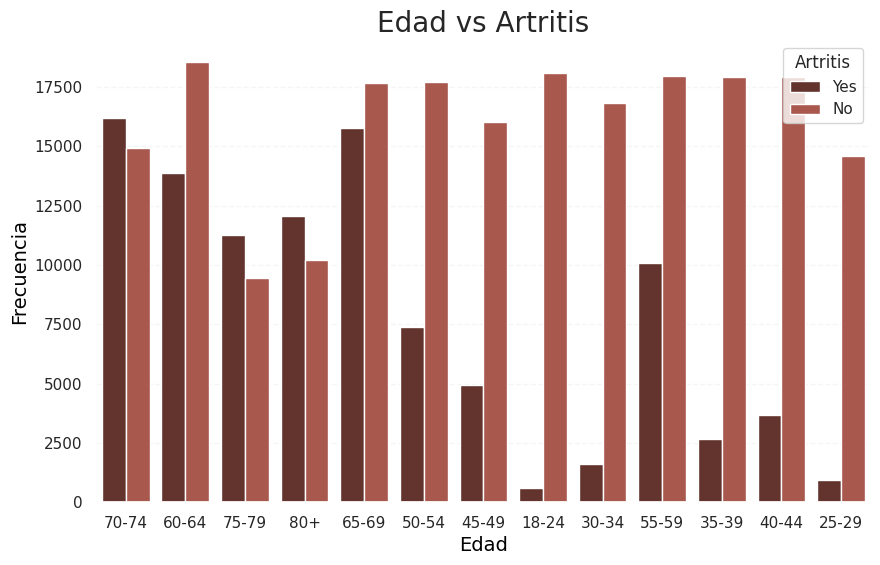

In [128]:
sns.set(style="whitegrid", rc={"axes.facecolor": "white", "axes.edgecolor": "white", "axes.labelcolor": "black"})

plt.figure(figsize=(10, 6))
ax = sns.countplot(x='v_age_category',  hue='v_arthritis', data=df, palette=['#6B2D24', '#B84D3E'])
ax.yaxis.grid(True, color='0.95', linestyle='--', alpha=0.7)  #Hacer lineas transparentes
ax.set_title('Edad vs Artritis', fontsize=20)
plt.xlabel('Edad', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.legend(title='Artritis')
plt.show()

#We observe that people over 65 are the ones who unfortunately have arthritis in greater numbers

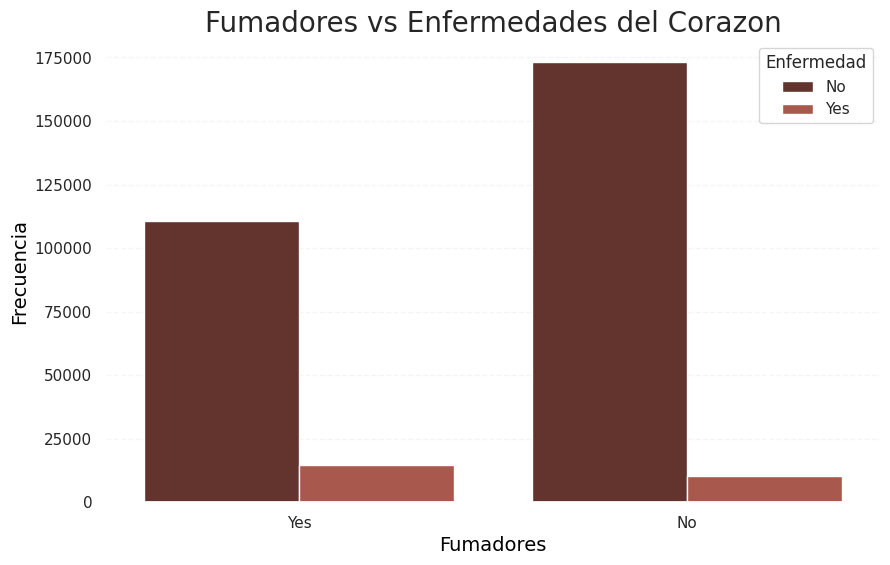

In [129]:
sns.set(style="whitegrid", rc={"axes.facecolor": "white", "axes.edgecolor": "white", "axes.labelcolor": "black"})
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='v_smoking_history',  hue='v_heart_disease', data=df, palette=['#6B2D24', '#B84D3E'])
ax.yaxis.grid(True, color='0.95', linestyle='--', alpha=0.7)  #Make transparent lines
ax.set_title('Fumadores vs Enfermedades del Corazon', fontsize=20)
plt.xlabel('Fumadores', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.legend(title='Enfermedad')
plt.show()

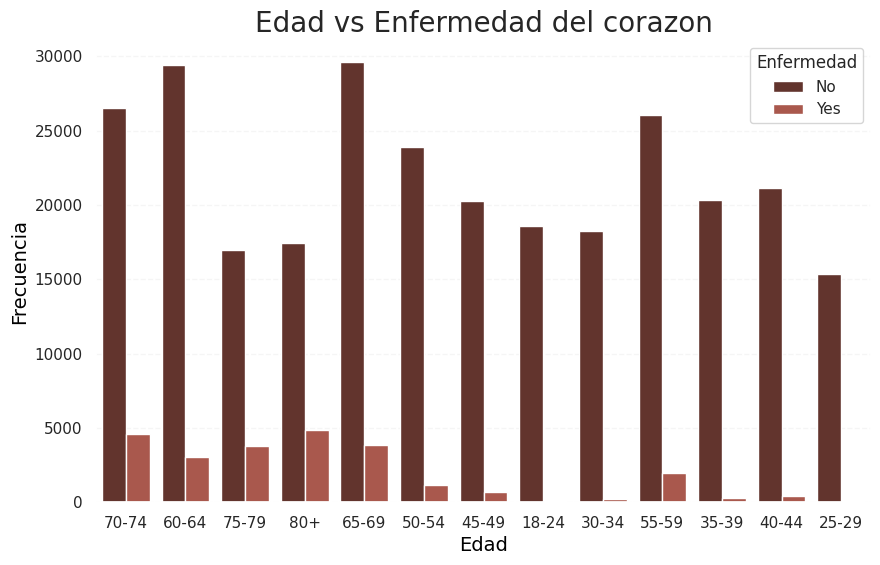

In [130]:
sns.set(style="whitegrid", rc={"axes.facecolor": "white", "axes.edgecolor": "white", "axes.labelcolor": "black"})

plt.figure(figsize=(10, 6))
ax = sns.countplot(x='v_age_category',  hue='v_heart_disease', data=df, palette=['#6B2D24', '#B84D3E'])
ax.yaxis.grid(True, color='0.95', linestyle='--', alpha=0.7)  #Hacer lineas transparentes
ax.set_title('Edad vs Enfermedad del corazon', fontsize=20)
plt.xlabel('Edad', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.legend(title='Enfermedad')
plt.show()

#It is observed that people over 60 suffer more from the heart

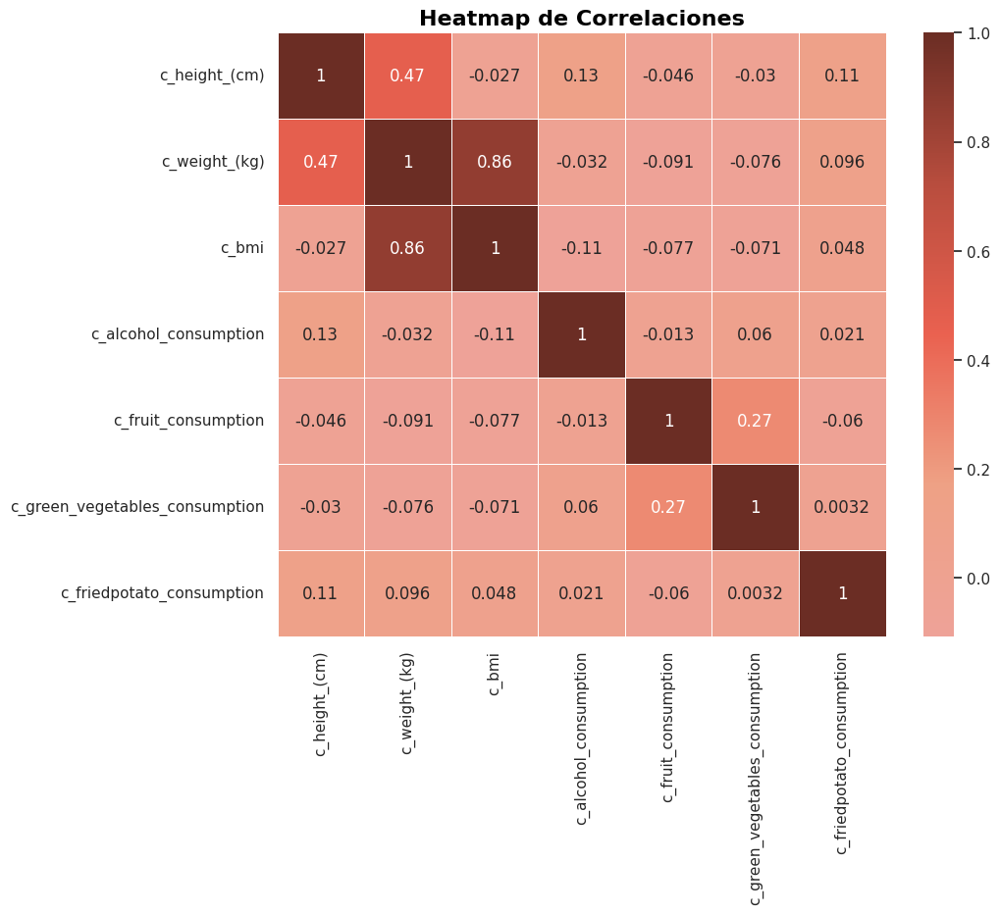

In [131]:
# matriz de correlaciones

numeric_columns = df.select_dtypes(include=['number'])

correlation_matrix = numeric_columns.corr()
#custom_palette = ['#6B2D24', '#B84D3E', '#EA6150', '#EEA185', '#EEA298']
custom_palette = ['#EEA298', '#EEA185','#EA6150',  '#B84D3E','#6B2D24']
cmap = mcolors.LinearSegmentedColormap.from_list("Custom", custom_palette)
sns.set(style="white")

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap=cmap, linewidths=0.5)

plt.title('Heatmap de Correlaciones', fontsize=16, fontweight='bold', fontname='Helvetica', color='black')

plt.show()

#We observed that the highest correlations are between bmi and weight, which makes sense because of the way it is
#calculate bmi, weight and height,

## Outliers

In [132]:
#Libraries to use in outliers
from functools import reduce

In [133]:
#Functions to use in outliers

def OUTLIERS(df,cols):
    results=pd.DataFrame()
    data_iqr=df.copy()
    data_per=df.copy()
    total=[]
    total_per=[]
    total_z=[]
    indices_=[]

    for col in cols:
        #IQR
        Q1=df[col].quantile(0.25)
        Q3=df[col].quantile(0.75)
        IQR=Q3-Q1
        INF=Q1-1.5*(IQR)
        SUP=Q3+1.5*(IQR)


        n_outliers=df[(df[col] < INF) | (df[col] > SUP)].shape[0]
        total.append(n_outliers)
        indices_iqr=list(df[(df[col] < INF) | (df[col] > SUP)].index)
        #data_iqr=data_iqr[~(data_iqr[col] < INF) | (data_iqr[col] > SUP)].reset_index(drop=True)

        #Percentiles
        INF_pe=np.percentile(df[col].dropna(),5)

        SUP_pe=np.percentile(df[col].dropna(),95)
        n_outliers_per=df[(df[col] < INF_pe) | (df[col] > SUP_pe)].shape[0]
        total_per.append(n_outliers_per)
        indices_per=list(df[(df[col] < INF_pe) | (df[col] > SUP_pe)].index)
        #data_per=data_per[~(data_per[col] < INF_pe) | (data_per[col] > SUP_pe)].reset_index(drop=True)

        #MEAN CHANGE

        #We get all the percentiles in addition to the maximum
        perc_100 = [x / 100 for x in range(100)]
        dist = df[col].describe(perc_100).iloc[4:]
        #We obtain the change between percentiles
        change_dist = df[col].describe(perc_100).iloc[4:].diff()
       #We obtain the average change between percentiles
        mean_change = df[col].describe(
            perc_100).iloc[4:].diff().mean()
        #If the change between the 99th percentile and the maximum is greater than the average change then:
        if change_dist["max"] > mean_change:
            #The upper band will be the maximum minus the average change
            ub = dist["max"] - mean_change
            #if the upper band is smaller than the 99th percentile, we modify the band to take the 99th percentile
            if ub < dist["99%"]:
                ub = dist["99%"]
        else:
        #If the change between the 99th percentile and the maximum is less than or equal to the average change then the 99th percentile is taken
            ub = dist["max"]

        if change_dist["1%"] > mean_change:
            lb = dist["0%"] + mean_change
            if lb > dist["1%"]:
                lb = dist["1%"]
        else:
            lb = dist["0%"]
        n_total_z=df[(df[col] < lb) | (df[col] > ub)].shape[0]
        total_z.append(n_total_z)
        indices_z=list(df[(df[col] < lb) | (df[col] > ub)].index)

        indices_.append(aux_outliers(indices_iqr,indices_per,indices_z))

    results["features"]=cols
    results["n_outliers_IQR"]=total
    results["n_outliers_Percentil"]=total_per
    results["n_outliers_Mean_Change"]=total_z
    results["n_outliers_IQR_%"]=round((results["n_outliers_IQR"]/df.shape[0])*100,2)
    results["n_outliers_Percentil_%"]=round((results["n_outliers_Percentil"]/df.shape[0])*100,2)
    results["n_outliers_Mean_Change_%"]=round((results["n_outliers_Mean_Change"]/df.shape[0])*100,2)
    results["indices"]=indices_
    results["total_outliers"]=results["indices"].map(lambda x:len(x))
    results["%_outliers"]=results["indices"].map(lambda x:round(((len(x)/df.shape[0])*100),2))
    results=results[['features', 'n_outliers_IQR', 'n_outliers_Percentil',
       'n_outliers_Mean_Change', 'n_outliers_IQR_%', 'n_outliers_Percentil_%',
       'n_outliers_Mean_Change_%',  'total_outliers', '%_outliers','indices']]
    return results
def aux_outliers(a,b,c):
    a=set(a)
    b=set(b)
    c=set(c)

    a_=a.intersection(b)

    b_=b.intersection(c)

    c_=a.intersection(c)

    outliers_index=list(set(list(a_)+list(b_)+list(c_)))
    return outliers_index

In [134]:
import plotly.figure_factory as ff
import plotly.io as pio

pio.renderers.default = "colab"

In [135]:
bins = 10

def histogram(df, col, bins, title, xaxis_title=None, yaxis_title=None):
    fig = make_subplots(rows=1, cols=1, subplot_titles=[title])
    trace = go.Histogram(x=df[col], nbinsx=bins, marker=dict(color="#6B2D24"))
    fig.add_trace(trace, row=1, col=1)

    fig.update_layout(
        xaxis=dict(title=xaxis_title, tickfont=dict(color='black'), showline=True, linewidth=1, linecolor='black'),
        yaxis=dict(title=yaxis_title, tickfont=dict(color='black'), showline=True, linewidth=1, linecolor='black'),
        title_font_family="Helvetica, monospace",
        title_font_color="black",
        template="plotly_white"
    )

    fig.update_traces(opacity=0.90, marker_line_color="black")
    pio.show(fig, renderer="colab")

for col in df.filter(like="c_"):
    title = f"Histograma de {col}"
    histogram(df, col, bins, title, xaxis_title=col, yaxis_title="Frecuencia")

In [136]:
outliers=OUTLIERS(df,list(df.filter(like="c_")))
print(outliers)

                         features  n_outliers_IQR  n_outliers_Percentil  \
0                   c_height_(cm)            1055                 25425   
1                   c_weight_(kg)            7326                 27159   
2                           c_bmi            9530                 30826   
3           c_alcohol_consumption           36147                 12285   
4             c_fruit_consumption           68212                 15046   
5  c_green_vegetables_consumption           11877                 13021   
6       c_friedpotato_consumption           19456                 12447   

   n_outliers_Mean_Change  n_outliers_IQR_%  n_outliers_Percentil_%  \
0                       6              0.34                    8.23   
1                       6              2.37                    8.80   
2                      26              3.09                    9.98   
3                       0             11.71                    3.98   
4                       0             22.09 

In [137]:
df.filter(like='c_')

,c_height_(cm),c_weight_(kg),c_bmi,c_alcohol_consumption,c_fruit_consumption,c_green_vegetables_consumption,c_friedpotato_consumption
0,150,32.66,14.54,0,30,16,12
1,165,77.11,28.29,0,30,0,4
2,163,88.45,33.47,4,12,3,16
3,180,93.44,28.73,0,30,30,8
4,191,88.45,24.37,0,8,4,0
...,...,...,...,...,...,...,...
308849,168,81.65,29.05,4,30,8,0
308850,180,69.85,21.48,8,15,60,4
308851,157,61.23,24.69,4,40,8,4
308852,183,79.38,23.73,3,30,12,0


In [138]:
#We print it again for better viewing
outliers=OUTLIERS(df,list(df.filter(like="c_")))
outliers


#We observe we have percentages of

,features,n_outliers_IQR,n_outliers_Percentil,n_outliers_Mean_Change,n_outliers_IQR_%,n_outliers_Percentil_%,n_outliers_Mean_Change_%,total_outliers,%_outliers,indices
0,c_height_(cm),1055,25425,6,0.34,8.23,0.00,1055,0.34,"[98311, 210952, 45065, 104458, 159757, 198669,..."
1,c_weight_(kg),7326,27159,6,2.37,8.80,0.00,7326,2.37,"[196609, 5, 294917, 262155, 262161, 262162, 29..."
2,c_bmi,9530,30826,26,3.09,9.98,0.01,9533,3.09,"[5, 294917, 163851, 262155, 15, 262161, 294930..."
3,c_alcohol_consumption,36147,12285,0,11.71,3.98,0.00,12285,3.98,"[229377, 65538, 98311, 131082, 32780, 98317, 9..."
4,c_fruit_consumption,68212,15046,0,22.09,4.87,0.00,3363,1.09,"[155651, 122892, 237581, 237583, 303123, 40982..."
5,c_green_vegetables_consumption,11877,13021,1,3.85,4.22,0.00,11877,3.85,"[163840, 229378, 229384, 229391, 32784, 196624..."
6,c_friedpotato_consumption,19456,12447,2,6.30,4.03,0.00,12447,4.03,"[262144, 65538, 262148, 32774, 262150, 32777, ..."


In [139]:
indices=list(outliers["indices"].values)
indices=list(set(reduce(lambda x,y: x+y, indices)))

len(indices)

df.shape

df[df.index.isin(indices)]

df=df[~df.index.isin(indices)].reset_index(drop=True)

In [140]:
percentage_removed = (len(indices) / df.shape[0]) * 100
percentage_removed

18.754663282181454

In [141]:
for col in df.filter(like="c_"):
    title = f"Histograma de {col}"
    histogram(df, col, bins, title, xaxis_title=col, yaxis_title="Frecuencia")

In [142]:
#we observed a vast improvement in the distribution of the histograms.
#We eliminate the atypical data of each variable in a group way, for each variable three different methods are calculated
#(IQR, Percentiles and Z-Score). Each variable on its own may have outlier values ​​but if checked against the
#intersection of the total of the outliers, this quantity is reduced and improvements in the distributions can be noticed
#of each variable, which are observed in the comparison of the histograms.

#We look for missing data
miss=completitud(df)
miss

,columna,total,completitud
0,v_general_health,0,100.0
1,c_fruit_consumption,0,100.0
2,c_alcohol_consumption,0,100.0
3,v_smoking_history,0,100.0
4,c_bmi,0,100.0
5,c_weight_(kg),0,100.0
6,c_height_(cm),0,100.0
7,v_age_category,0,100.0
8,c_green_vegetables_consumption,0,100.0
9,v_sex,0,100.0


## Variable engineering

In [143]:
#We remember that we engineered the v_diabetes values ​​by grouping two categories and rewriting a third.

In [144]:
#We perform one hot encoding to the base. The variables with which we would use the method are:
#v_heart_disease, 'v_skin_cancer', 'v_other_cancer', 'v_depression', 'v_arthritis', 'v_sex'

#df["aux_v_heart_disease"]=df["v_heart_disease"].map(lambda x: 1 if x=="Yes" else 0)
#df["aux_v_skin_cancer"]=df["v_skin_cancer"].map(lambda x: 1 if x=="Yes" else 0)
#df["aux_v_other_cancer"]=df["v_other_cancer"].map(lambda x: 1 if x=="Yes" else 0)
#df["aux_v_depression"]=df["v_depression"].map(lambda x: 1 if x=="Yes" else 0)
#df["aux_v_arthritis"]=df["v_arthritis"].map(lambda x: 1 if x=="Yes" else 0)
#df["aux_v_sex"]=df["v_sex"].map(lambda x: 1 if x=="Female" else 0)

In [145]:
#We will also create an additional variable in which it tells us according to its bmi in which category it belongs

def categorize_bmi(bmi):
    if bmi < 18.5:
        return "1"
    elif 18.5 <= bmi <= 24.9:
        return "2"
    elif 25 <= bmi <= 29.9:
        return "3"
    else:
        return "4"

#Where 1 is underweight, 2 is normal, 3 is overweight and 4 is obese.

df['v_bmi_categoria'] = df['c_bmi'].apply(categorize_bmi)

In [146]:
df.columns

Index(['v_general_health', 'v_checkup', 'v_exercise', 'v_heart_disease',
       'v_skin_cancer', 'v_other_cancer', 'v_depression', 'v_diabetes',
       'v_arthritis', 'v_sex', 'v_age_category', 'c_height_(cm)',
       'c_weight_(kg)', 'c_bmi', 'v_smoking_history', 'c_alcohol_consumption',
       'c_fruit_consumption', 'c_green_vegetables_consumption',
       'c_friedpotato_consumption', 'v_bmi_categoria'],
      dtype='object')

In [147]:
#Modify categorical variables

#We look for consistency within categorical data

unique_values_per_column = {column: df[column].unique() for column in df.columns if column.startswith('v_')}
for column, values in unique_values_per_column.items():
    print(f"Valores para {column}:{values}")

Valores para v_general_health:['Poor' 'Very Good' 'Good' 'Fair' 'Excellent']
Valores para v_checkup:['Within the past 2 years' 'Within the past year' '5 or more years ago'
 'Within the past 5 years' 'Never']
Valores para v_exercise:['No' 'Yes']
Valores para v_heart_disease:['No' 'Yes']
Valores para v_skin_cancer:['No' 'Yes']
Valores para v_other_cancer:['No' 'Yes']
Valores para v_depression:['No' 'Yes']
Valores para v_diabetes:['No' 'Yes' 'Prediabetes']
Valores para v_arthritis:['Yes' 'No']
Valores para v_sex:['Female' 'Male']
Valores para v_age_category:['70-74' '60-64' '75-79' '80+' '65-69' '50-54' '45-49' '18-24' '30-34'
 '55-59' '35-39' '40-44' '25-29']
Valores para v_smoking_history:['Yes' 'No']
Valores para v_bmi_categoria:['1' '3' '4' '2']


In [148]:
df = df.replace({'Poor':0, 'Very Good':3, 'Good':2, 'Fair':1, 'Excellent':4})
df = df.replace({'Within the past 2 years':2, 'Within the past year':1, '5 or more years ago':4, 'Within the past 5 years':3, 'Never':0})
df = df.replace({'No':0,'Yes':1})
df = df.replace({'No':0, 'Yes':1, 'Prediabetes':2})
df = df.replace({'Female':0,'Male':1})
df = df.replace({'70-74':10, '60-64':8, '75-79':11, '80+':12, '65-69':9, '50-54':6, '45-49':5, '18-24':0, '30-34':2,'55-59':7, '35-39':3, '40-44':4, '25-29':1,})
#df = df.replace({'No':0, 'Yes':3, 'No, pre-diabetes or borderline diabetes':1,'Yes, but female told only during pregnancy':2})

In [149]:
unique_values_per_column = {column: df[column].unique() for column in df.columns if column.startswith('v_')}
for column, values in unique_values_per_column.items():
    print(f"Valores para {column}:{values}")

Valores para v_general_health:[0 3 2 1 4]
Valores para v_checkup:[2 1 4 3 0]
Valores para v_exercise:[0 1]
Valores para v_heart_disease:[0 1]
Valores para v_skin_cancer:[0 1]
Valores para v_other_cancer:[0 1]
Valores para v_depression:[0 1]
Valores para v_diabetes:[0 1 2]
Valores para v_arthritis:[1 0]
Valores para v_sex:[0 1]
Valores para v_age_category:[10  8 11 12  9  6  5  0  2  7  3  4  1]
Valores para v_smoking_history:[1 0]
Valores para v_bmi_categoria:['1' '3' '4' '2']


In [150]:
df.columns

Index(['v_general_health', 'v_checkup', 'v_exercise', 'v_heart_disease',
       'v_skin_cancer', 'v_other_cancer', 'v_depression', 'v_diabetes',
       'v_arthritis', 'v_sex', 'v_age_category', 'c_height_(cm)',
       'c_weight_(kg)', 'c_bmi', 'v_smoking_history', 'c_alcohol_consumption',
       'c_fruit_consumption', 'c_green_vegetables_consumption',
       'c_friedpotato_consumption', 'v_bmi_categoria'],
      dtype='object')

In [151]:
#df = df[df.columns.drop(list(df.filter(like='aux_')))]

In [152]:
#Rename target variable
df.rename(columns={'v_heart_disease': 'tgt_heart_disease'}, inplace=True)

In [153]:
df.columns

Index(['v_general_health', 'v_checkup', 'v_exercise', 'tgt_heart_disease',
       'v_skin_cancer', 'v_other_cancer', 'v_depression', 'v_diabetes',
       'v_arthritis', 'v_sex', 'v_age_category', 'c_height_(cm)',
       'c_weight_(kg)', 'c_bmi', 'v_smoking_history', 'c_alcohol_consumption',
       'c_fruit_consumption', 'c_green_vegetables_consumption',
       'c_friedpotato_consumption', 'v_bmi_categoria'],
      dtype='object')

In [154]:
df.head()

,v_general_health,v_checkup,v_exercise,tgt_heart_disease,v_skin_cancer,v_other_cancer,v_depression,v_diabetes,v_arthritis,v_sex,v_age_category,c_height_(cm),c_weight_(kg),c_bmi,v_smoking_history,c_alcohol_consumption,c_fruit_consumption,c_green_vegetables_consumption,c_friedpotato_consumption,v_bmi_categoria
0,0,2,0,0,0,0,0,0,1,0,10,150,32.66,14.54,1,0,30,16,12,1
1,3,1,0,1,0,0,0,1,0,0,10,165,77.11,28.29,0,0,30,0,4,3
2,3,1,1,0,0,0,0,1,0,0,8,163,88.45,33.47,0,4,12,3,16,4
3,0,1,1,1,0,0,0,1,0,1,11,180,93.44,28.73,0,0,30,30,8,3
4,2,1,0,0,0,0,0,0,0,1,12,191,88.45,24.37,1,0,8,4,0,2


In [155]:
df.corr().tgt_heart_disease

v_general_health                 -0.236474
v_checkup                        -0.087155
v_exercise                       -0.097364
tgt_heart_disease                 1.000000
v_skin_cancer                     0.092955
v_other_cancer                    0.094759
v_depression                      0.030038
v_diabetes                        0.147549
v_arthritis                       0.154444
v_sex                             0.073260
v_age_category                    0.233058
c_height_(cm)                     0.016897
c_weight_(kg)                     0.049865
c_bmi                             0.047078
v_smoking_history                 0.111076
c_alcohol_consumption            -0.052399
c_fruit_consumption              -0.020735
c_green_vegetables_consumption   -0.021734
c_friedpotato_consumption        -0.022930
Name: tgt_heart_disease, dtype: float64

### Balanced

In [156]:
dfb=df.copy()

In [157]:
type(dfb)

pandas.core.frame.DataFrame

In [158]:
dfb.head()

,v_general_health,v_checkup,v_exercise,tgt_heart_disease,v_skin_cancer,v_other_cancer,v_depression,v_diabetes,v_arthritis,v_sex,v_age_category,c_height_(cm),c_weight_(kg),c_bmi,v_smoking_history,c_alcohol_consumption,c_fruit_consumption,c_green_vegetables_consumption,c_friedpotato_consumption,v_bmi_categoria
0,0,2,0,0,0,0,0,0,1,0,10,150,32.66,14.54,1,0,30,16,12,1
1,3,1,0,1,0,0,0,1,0,0,10,165,77.11,28.29,0,0,30,0,4,3
2,3,1,1,0,0,0,0,1,0,0,8,163,88.45,33.47,0,4,12,3,16,4
3,0,1,1,1,0,0,0,1,0,1,11,180,93.44,28.73,0,0,30,30,8,3
4,2,1,0,0,0,0,0,0,0,1,12,191,88.45,24.37,1,0,8,4,0,2


In [159]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from collections import Counter

#Define over and under sampling strategies
over = SMOTE(sampling_strategy=1)
under = RandomUnderSampler(sampling_strategy=0.1)

X = dfb.drop(columns=['tgt_heart_disease'])
y = dfb['tgt_heart_disease']

#Define pipeline passes
steps = [('under', under), ('over', over)]

pipeline = Pipeline(steps=steps)

#Apply over and under techniques
X_r, y_r = pipeline.fit_resample(X, y)


#Check post-sampling distribution
dist = Counter(y_r)
print(dist)

Counter({0: 209440, 1: 209440})


In [160]:
from sklearn.utils import shuffle

dfb_r = pd.concat([pd.DataFrame(X_r, columns=X.columns), pd.DataFrame({'tgt_heart_disease': y_r})], axis=1) #Combinar las variables rebalanceadas y la target en un nuevo data frame
dfb_r = shuffle(dfb_r, random_state=42) #Revolver data

In [161]:
#from imblearn.over_sampling import SMOTE
#from sklearn.utils import shuffle

#X = dfb.drop(columns=['tgt_heart_disease']) #Definir variables y variable objetivo
#y = dfb['tgt_heart_disease']

#smote = SMOTE(sampling_strategy='auto') # Instanciar SMOTE

#X_r, y_r = smote.fit_resample(X, y) #Aplicar smote para balancear data set

#dfb_r = pd.concat([pd.DataFrame(X_r, columns=X.columns), pd.DataFrame({'tgt_heart_disease': y_r})], axis=1) #Combinar las variables rebalanceadas y la target en un nuevo data frame

#dfb_r = shuffle(dfb_r, random_state=42) #Revolver data

#dfb_r = pd.DataFrame(dfb_r, columns=dfb.columns)

In [162]:
type(dfb_r)

pandas.core.frame.DataFrame

In [163]:
dfb_r.shape

(418880, 20)

In [164]:
dfb_r.reset_index(drop=True, inplace=True)

In [165]:
dfb_r.head()

,v_general_health,v_checkup,v_exercise,v_skin_cancer,v_other_cancer,v_depression,v_diabetes,v_arthritis,v_sex,v_age_category,c_height_(cm),c_weight_(kg),c_bmi,v_smoking_history,c_alcohol_consumption,c_fruit_consumption,c_green_vegetables_consumption,c_friedpotato_consumption,v_bmi_categoria,tgt_heart_disease
0,4,1,0,0,0,0,0,0,1,11,170,85.601185,29.558534,0,0,60,25,0,3.0,1
1,2,1,0,0,0,0,0,0,0,10,170,63.500000,21.930000,1,3,30,16,4,2.0,1
2,3,1,0,0,0,1,0,0,0,4,168,63.050000,22.430000,1,28,0,8,16,2.0,0
3,3,1,1,0,0,1,0,1,0,10,173,70.310000,23.570000,1,1,30,20,3,2.0,0
4,0,1,0,0,0,0,0,0,0,2,160,47.630000,18.600000,0,0,0,1,5,2.0,0


In [166]:
dfb_r['tgt_heart_disease'].value_counts()

1    209440
0    209440
Name: tgt_heart_disease, dtype: int64

## Module 4: Cognitive techniques and introduction to Big Data

### Balanced Database

In [82]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping

# Assume dfb_r is your balanced dataframe
# Separate features (X) and target variable (y)
X = dfb_r.drop(columns=['tgt_heart_disease'])
y = dfb_r['tgt_heart_disease']

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=50)
print(np.unique(y_train, return_counts=True), np.unique(y_test, return_counts=True))

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


(array([0, 1]), array([167403, 167701])) (array([0, 1]), array([42037, 41739]))


In [195]:
# Build the neural network model
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Define EarlyStopping callback
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

In [197]:
# Train the model with validation data
history = model.fit(X_train_scaled, y_train, epochs=30, validation_data=(X_test_scaled, y_test), callbacks=[early_stop], verbose=1)

Epoch 1/30
10472/10472 [==============================] - 26s 2ms/step - loss: 0.3767 - accuracy: 0.8319 - val_loss: 0.3790 - val_accuracy: 0.8309
Epoch 2/30
10472/10472 [==============================] - 31s 3ms/step - loss: 0.3745 - accuracy: 0.8328 - val_loss: 0.3783 - val_accuracy: 0.8317
Epoch 3/30
10472/10472 [==============================] - 25s 2ms/step - loss: 0.3723 - accuracy: 0.8335 - val_loss: 0.3744 - val_accuracy: 0.8331
Epoch 4/30
10472/10472 [==============================] - 31s 3ms/step - loss: 0.3706 - accuracy: 0.8352 - val_loss: 0.3732 - val_accuracy: 0.8339
Epoch 5/30
10472/10472 [==============================] - 29s 3ms/step - loss: 0.3689 - accuracy: 0.8356 - val_loss: 0.3723 - val_accuracy: 0.8349
Epoch 6/30
10472/10472 [==============================] - 25s 2ms/step - loss: 0.3675 - accuracy: 0.8358 - val_loss: 0.3731 - val_accuracy: 0.8346
Epoch 7/30
10472/10472 [==============================] - 26s 3ms/step - loss: 0.3657 - accuracy: 0.8372 - val_loss: 0

In [202]:
history = model.fit(X_train_scaled, y_train, epochs=30, validation_data=(X_test_scaled, y_test), verbose=1)

Epoch 1/30
10472/10472 [==============================] - 24s 2ms/step - loss: 0.3586 - accuracy: 0.8407 - val_loss: 0.3637 - val_accuracy: 0.8392
Epoch 2/30
10472/10472 [==============================] - 24s 2ms/step - loss: 0.3575 - accuracy: 0.8409 - val_loss: 0.3697 - val_accuracy: 0.8357
Epoch 3/30
10472/10472 [==============================] - 26s 3ms/step - loss: 0.3565 - accuracy: 0.8421 - val_loss: 0.3631 - val_accuracy: 0.8391
Epoch 4/30
10472/10472 [==============================] - 24s 2ms/step - loss: 0.3558 - accuracy: 0.8421 - val_loss: 0.3633 - val_accuracy: 0.8392
Epoch 5/30
10472/10472 [==============================] - 23s 2ms/step - loss: 0.3551 - accuracy: 0.8425 - val_loss: 0.3655 - val_accuracy: 0.8374
Epoch 6/30
10472/10472 [==============================] - 24s 2ms/step - loss: 0.3544 - accuracy: 0.8423 - val_loss: 0.3625 - val_accuracy: 0.8395
Epoch 7/30
10472/10472 [==============================] - 26s 2ms/step - loss: 0.3536 - accuracy: 0.8437 - val_loss: 0

In [203]:
# Evaluate model on train set
train_loss, train_accuracy = model.evaluate(X_train_scaled, y_train, verbose=0)
print("Train Loss:", train_loss)
print("Train Accuracy:", train_accuracy)

# Evaluate model on test set
test_loss, test_accuracy = model.evaluate(X_test_scaled, y_test, verbose=0)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Predict probabilities for test set
y_pred_prob = model.predict(X_test_scaled)

# Predict classes for test set
y_pred = (y_pred_prob > 0.5).astype(int)

# Calculate additional classification metrics
print("\nClassification Report:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))

# Calculate ROC-AUC score
roc_auc = roc_auc_score(y_test, y_pred_prob)
print("ROC AUC Score:", roc_auc)

Train Loss: 0.3402976989746094
Train Accuracy: 0.8510552048683167
Test Loss: 0.35571467876434326
Test Accuracy: 0.842520534992218
2618/2618 [==============================] - 4s 1ms/step

Classification Report:
Accuracy: 0.8425205309396486
Precision: 0.8358036890645586
Recall: 0.8511224514243274
F1 Score: 0.8433935163752478
ROC AUC Score: 0.9214708186539639


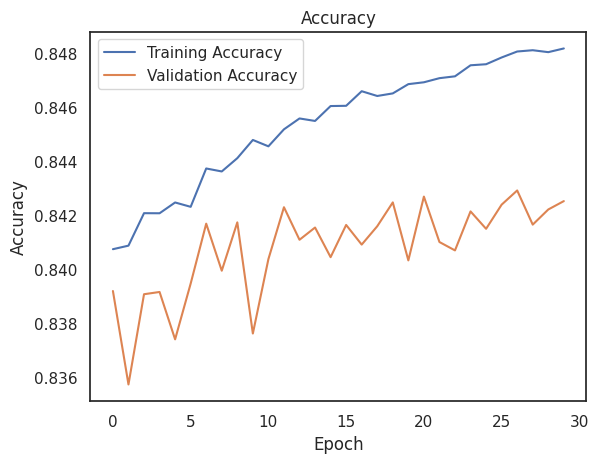

In [204]:
# Plot training history
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

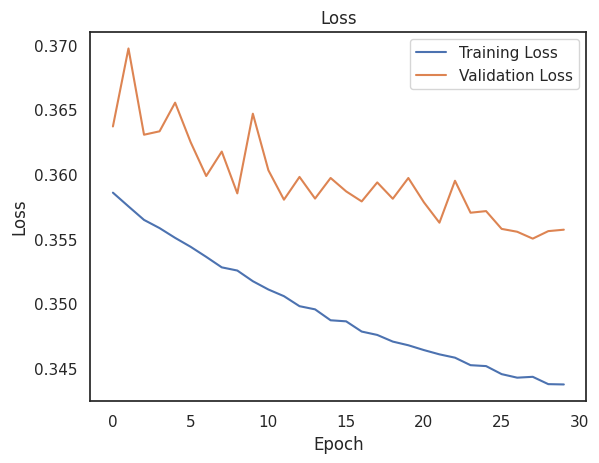

In [205]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

2618/2618 [==============================] - 4s 2ms/step


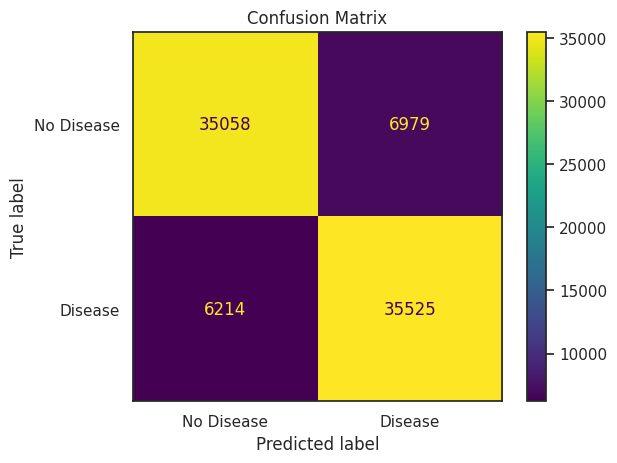

In [206]:
# Calculate confusion matrix
y_pred = (model.predict(X_test_scaled) > 0.5).astype(int)
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(conf_matrix, display_labels=['No Disease', 'Disease'])
disp.plot()
plt.title('Confusion Matrix')
plt.show()

In [84]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping

X = dfb_r.drop(columns=['tgt_heart_disease'])
y = dfb_r['tgt_heart_disease']

#Split en train y test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=50)
print(np.unique(y_train, return_counts=True), np.unique(y_test, return_counts=True))

#Estandarizar
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#Modelo
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

(array([0, 1]), array([167403, 167701])) (array([0, 1]), array([42037, 41739]))


In [207]:
# Function with EarlyStopping
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train the model with the validation data
history = model.fit(X_train_scaled, y_train, epochs=10, validation_data=(X_test_scaled, y_test), callbacks=[early_stop], verbose=1)

# Evaluate it on the train
train_loss, train_accuracy = model.evaluate(X_train_scaled, y_train, verbose=0)
print("Train Loss:", train_loss)
print("Train Accuracy:", train_accuracy)

# Evaluate in the test
test_loss, test_accuracy = model.evaluate(X_test_scaled, y_test, verbose=0)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

#Predict probabilities for the test
y_pred_prob = model.predict(X_test_scaled)

# Predict classes for the test set
y_pred = (y_pred_prob > 0.5).astype(int)

#Calculate ranking metrics
print("\nClassification Report:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))

#Calculate ROC AUC
roc_auc = roc_auc_score(y_test, y_pred_prob)
print("ROC AUC Score:", roc_auc)

(array([0, 1]), array([167403, 167701])) (array([0, 1]), array([42037, 41739]))
Epoch 1/10
10472/10472 [==============================] - 32s 3ms/step - loss: 0.3918 - accuracy: 0.8247 - val_loss: 0.3853 - val_accuracy: 0.8292
Epoch 2/10
10472/10472 [==============================] - 26s 2ms/step - loss: 0.3833 - accuracy: 0.8283 - val_loss: 0.3823 - val_accuracy: 0.8300
Epoch 3/10
10472/10472 [==============================] - 24s 2ms/step - loss: 0.3796 - accuracy: 0.8299 - val_loss: 0.3811 - val_accuracy: 0.8313
Epoch 4/10
10472/10472 [==============================] - 26s 2ms/step - loss: 0.3773 - accuracy: 0.8316 - val_loss: 0.3795 - val_accuracy: 0.8308
Epoch 5/10
10472/10472 [==============================] - 26s 2ms/step - loss: 0.3750 - accuracy: 0.8323 - val_loss: 0.3750 - val_accuracy: 0.8342
Epoch 6/10
10472/10472 [==============================] - 24s 2ms/step - loss: 0.3731 - accuracy: 0.8329 - val_loss: 0.3761 - val_accuracy: 0.8331
Epoch 7/10
10472/10472 [==============

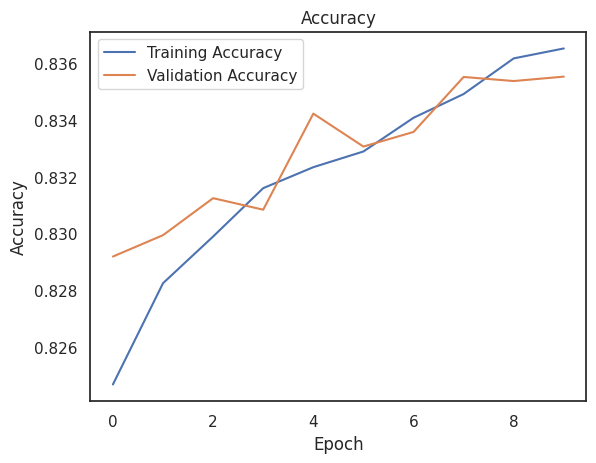

In [209]:
# Accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

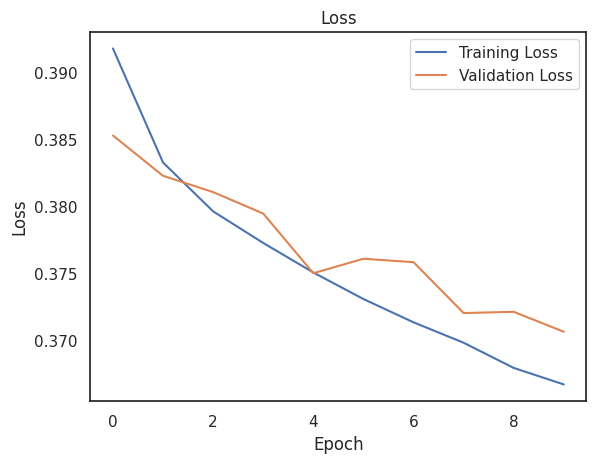

In [210]:
#Loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

2618/2618 [==============================] - 4s 1ms/step


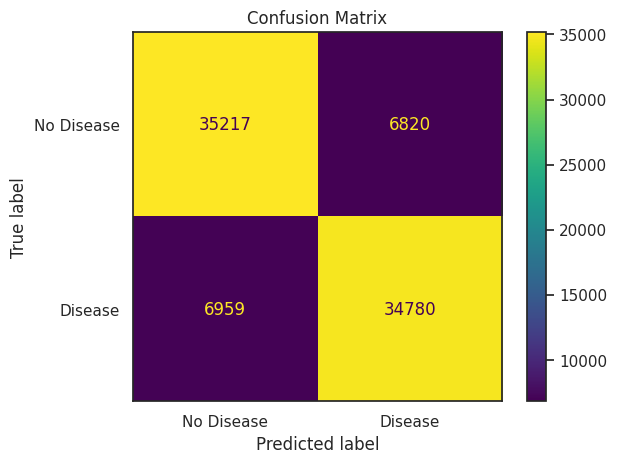

In [208]:
#Confusion Matrix
y_pred = (model.predict(X_test_scaled) > 0.5).astype(int)
conf_matrix = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(conf_matrix, display_labels=['No Disease', 'Disease'])
disp.plot()
plt.title('Confusion Matrix')
plt.show()

### Additional layer

Now an additional layer was added.

In [85]:
X = dfb_r.drop(columns=['tgt_heart_disease'])
y = dfb_r['tgt_heart_disease']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=50)
print(np.unique(y_train, return_counts=True), np.unique(y_test, return_counts=True))

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(16, activation='relu'),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history = model.fit(X_train_scaled, y_train, epochs=10, validation_data=(X_test_scaled, y_test), callbacks=[early_stop], verbose=1)

(array([0, 1]), array([167403, 167701])) (array([0, 1]), array([42037, 41739]))
Epoch 1/10
10472/10472 [==============================] - 44s 4ms/step - loss: 0.3915 - accuracy: 0.8249 - val_loss: 0.3856 - val_accuracy: 0.8284
Epoch 2/10
10472/10472 [==============================] - 29s 3ms/step - loss: 0.3829 - accuracy: 0.8291 - val_loss: 0.3819 - val_accuracy: 0.8300
Epoch 3/10
10472/10472 [==============================] - 30s 3ms/step - loss: 0.3790 - accuracy: 0.8308 - val_loss: 0.3789 - val_accuracy: 0.8314
Epoch 4/10
10472/10472 [==============================] - 31s 3ms/step - loss: 0.3755 - accuracy: 0.8324 - val_loss: 0.3776 - val_accuracy: 0.8332
Epoch 5/10
10472/10472 [==============================] - 31s 3ms/step - loss: 0.3721 - accuracy: 0.8342 - val_loss: 0.3729 - val_accuracy: 0.8342
Epoch 6/10
10472/10472 [==============================] - 29s 3ms/step - loss: 0.3688 - accuracy: 0.8363 - val_loss: 0.3734 - val_accuracy: 0.8358
Epoch 7/10
10472/10472 [==============

In [86]:
train_loss, train_accuracy = model.evaluate(X_train_scaled, y_train, verbose=0)
print("Train Loss:", train_loss)
print("Train Accuracy:", train_accuracy)

test_loss, test_accuracy = model.evaluate(X_test_scaled, y_test, verbose=0)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

y_pred_prob = model.predict(X_test_scaled)

y_pred = (y_pred_prob > 0.5).astype(int)

print("\nClassification Report:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))

roc_auc = roc_auc_score(y_test, y_pred_prob)
print("ROC AUC Score:", roc_auc)

Train Loss: 0.3506404161453247
Train Accuracy: 0.8463939428329468
Test Loss: 0.3648659288883209
Test Accuracy: 0.8382233381271362
2618/2618 [==============================] - 5s 2ms/step

Classification Report:
Accuracy: 0.8382233575248281
Precision: 0.8306818715096908
Recall: 0.8481755672153142
F1 Score: 0.8393375772016548
ROC AUC Score: 0.9169725173736117


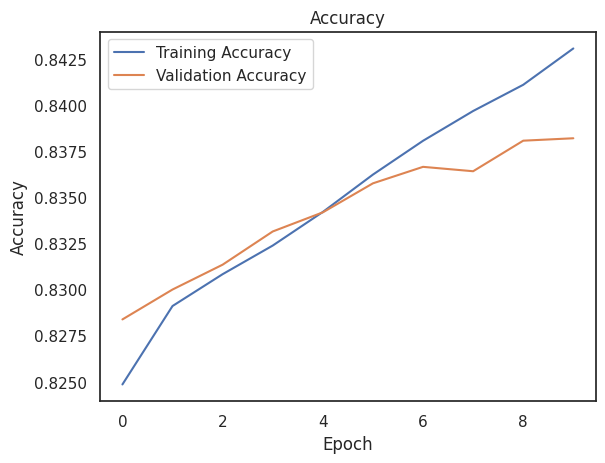

In [87]:
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

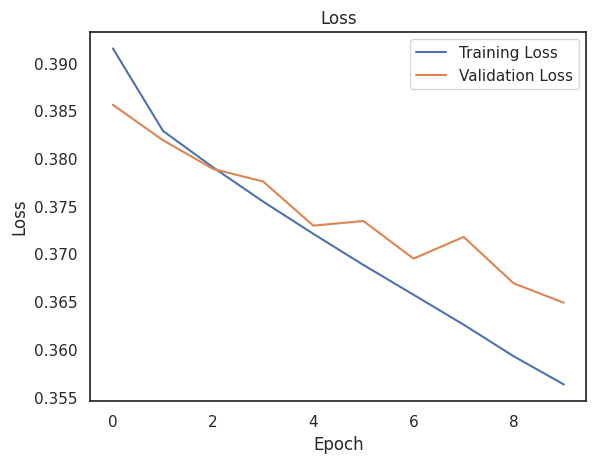

In [88]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

2618/2618 [==============================] - 7s 3ms/step


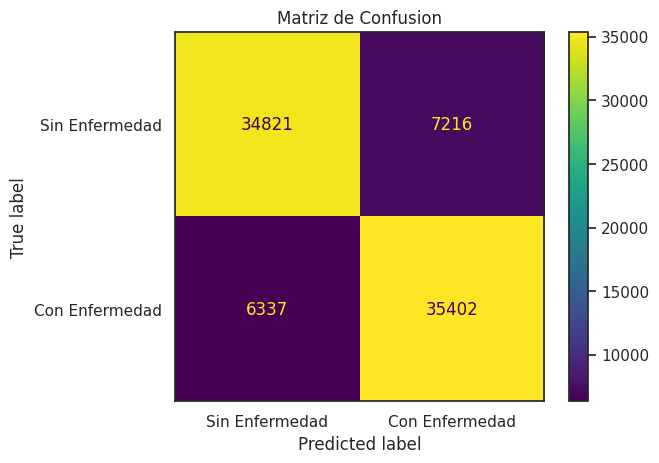

In [91]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
#Confusion Matrix

y_pred = (model.predict(X_test_scaled) > 0.5).astype(int)
conf_matrix = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(conf_matrix, display_labels=['Sin Enfermedad', 'Con Enfermedad'])
disp.plot()
plt.title('Matriz de Confusion')
plt.show()

### Decrease Neurons

Now the number of layers was maintained but the number of neurons was decreased.

In [92]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping

X = dfb_r.drop(columns=['tgt_heart_disease'])
y = dfb_r['tgt_heart_disease']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=50)
print(np.unique(y_train, return_counts=True), np.unique(y_test, return_counts=True))

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model = Sequential([
    Dense(32, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(16, activation='relu'),
    Dense(8, activation='relu'),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history = model.fit(X_train_scaled, y_train, epochs=10, validation_data=(X_test_scaled, y_test), callbacks=[early_stop], verbose=1)

(array([0, 1]), array([167403, 167701])) (array([0, 1]), array([42037, 41739]))
Epoch 1/10
10472/10472 [==============================] - 37s 3ms/step - loss: 0.3949 - accuracy: 0.8224 - val_loss: 0.3885 - val_accuracy: 0.8284
Epoch 2/10
10472/10472 [==============================] - 24s 2ms/step - loss: 0.3856 - accuracy: 0.8271 - val_loss: 0.3852 - val_accuracy: 0.8297
Epoch 3/10
10472/10472 [==============================] - 48s 5ms/step - loss: 0.3826 - accuracy: 0.8282 - val_loss: 0.3842 - val_accuracy: 0.8300
Epoch 4/10
10472/10472 [==============================] - 30s 3ms/step - loss: 0.3805 - accuracy: 0.8296 - val_loss: 0.3817 - val_accuracy: 0.8298
Epoch 5/10
10472/10472 [==============================] - 28s 3ms/step - loss: 0.3789 - accuracy: 0.8301 - val_loss: 0.3822 - val_accuracy: 0.8300
Epoch 6/10
10472/10472 [==============================] - 51s 5ms/step - loss: 0.3778 - accuracy: 0.8307 - val_loss: 0.3796 - val_accuracy: 0.8305
Epoch 7/10
10472/10472 [==============

In [93]:
train_loss, train_accuracy = model.evaluate(X_train_scaled, y_train, verbose=0)
print("Train Loss:", train_loss)
print("Train Accuracy:", train_accuracy)

test_loss, test_accuracy = model.evaluate(X_test_scaled, y_test, verbose=0)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

y_pred_prob = model.predict(X_test_scaled)

y_pred = (y_pred_prob > 0.5).astype(int)

print("\nClassification Report:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))

roc_auc = roc_auc_score(y_test, y_pred_prob)
print("ROC AUC Score:", roc_auc)

Train Loss: 0.37185749411582947
Train Accuracy: 0.8333920240402222
Test Loss: 0.37616437673568726
Test Accuracy: 0.8325057029724121
2618/2618 [==============================] - 5s 2ms/step

Classification Report:
Accuracy: 0.832505729564553
Precision: 0.819256562118314
Recall: 0.8517214116294114
F1 Score: 0.8351736127425646
ROC AUC Score: 0.9116704253759836


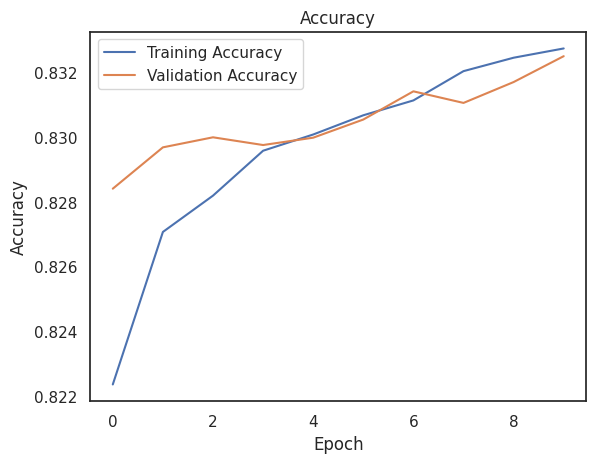

In [97]:
#Accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

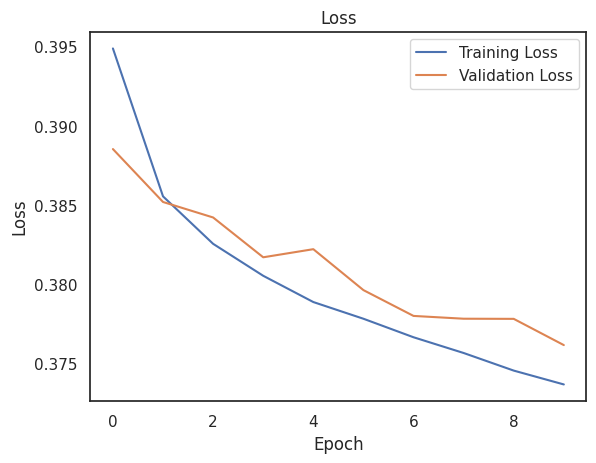

In [96]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

2618/2618 [==============================] - 4s 1ms/step


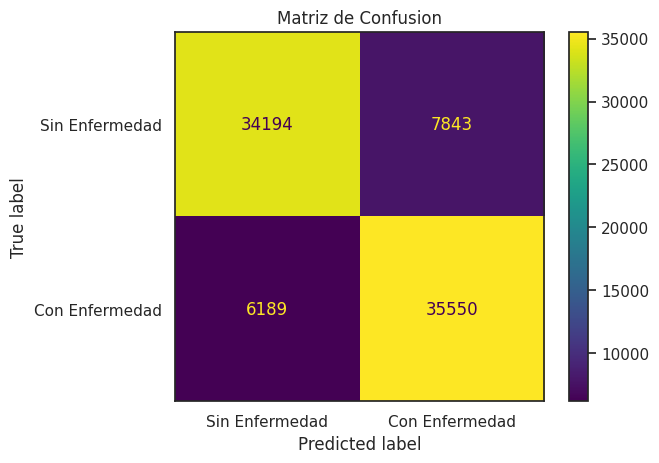

In [95]:
#Confusion Matrix

y_pred = (model.predict(X_test_scaled) > 0.5).astype(int)
conf_matrix = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(conf_matrix, display_labels=['Sin Enfermedad', 'Con Enfermedad'])
disp.plot()
plt.title('Matriz de Confusion')
plt.show()

### Increase in Epochs

In [98]:
X = dfb_r.drop(columns=['tgt_heart_disease'])
y = dfb_r['tgt_heart_disease']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=50)
print(np.unique(y_train, return_counts=True), np.unique(y_test, return_counts=True))

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model = Sequential([
    Dense(32, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(16, activation='relu'),
    Dense(8, activation='relu'),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history = model.fit(X_train_scaled, y_train, epochs=20, validation_data=(X_test_scaled, y_test), callbacks=[early_stop], verbose=1)

(array([0, 1]), array([167403, 167701])) (array([0, 1]), array([42037, 41739]))
Epoch 1/20
10472/10472 [==============================] - 41s 4ms/step - loss: 0.3955 - accuracy: 0.8217 - val_loss: 0.3878 - val_accuracy: 0.8281
Epoch 2/20
10472/10472 [==============================] - 35s 3ms/step - loss: 0.3853 - accuracy: 0.8273 - val_loss: 0.3851 - val_accuracy: 0.8280
Epoch 3/20
10472/10472 [==============================] - 27s 3ms/step - loss: 0.3825 - accuracy: 0.8284 - val_loss: 0.3834 - val_accuracy: 0.8302
Epoch 4/20
10472/10472 [==============================] - 41s 4ms/step - loss: 0.3804 - accuracy: 0.8297 - val_loss: 0.3817 - val_accuracy: 0.8308
Epoch 5/20
10472/10472 [==============================] - 45s 4ms/step - loss: 0.3790 - accuracy: 0.8305 - val_loss: 0.3799 - val_accuracy: 0.8314
Epoch 6/20
10472/10472 [==============================] - 42s 4ms/step - loss: 0.3777 - accuracy: 0.8312 - val_loss: 0.3793 - val_accuracy: 0.8309
Epoch 7/20
10472/10472 [==============

In [99]:
train_loss, train_accuracy = model.evaluate(X_train_scaled, y_train, verbose=0)
print("Train Loss:", train_loss)
print("Train Accuracy:", train_accuracy)

test_loss, test_accuracy = model.evaluate(X_test_scaled, y_test, verbose=0)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

y_pred_prob = model.predict(X_test_scaled)

y_pred = (y_pred_prob > 0.5).astype(int)

print("\nClassification Report:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))

roc_auc = roc_auc_score(y_test, y_pred_prob)
print("ROC AUC Score:", roc_auc)

Train Loss: 0.36996299028396606
Train Accuracy: 0.8353376984596252
Test Loss: 0.37399962544441223
Test Accuracy: 0.833759069442749
2618/2618 [==============================] - 4s 1ms/step

Classification Report:
Accuracy: 0.8337590718105424
Precision: 0.8241340730035895
Recall: 0.8470974388461631
F1 Score: 0.8354579931711582
ROC AUC Score: 0.9127161645556352


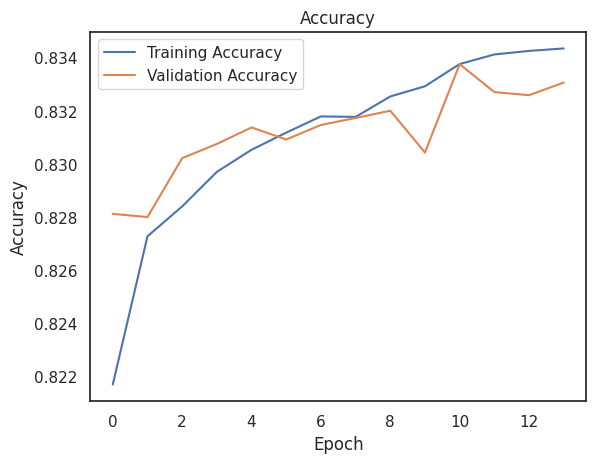

In [100]:
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

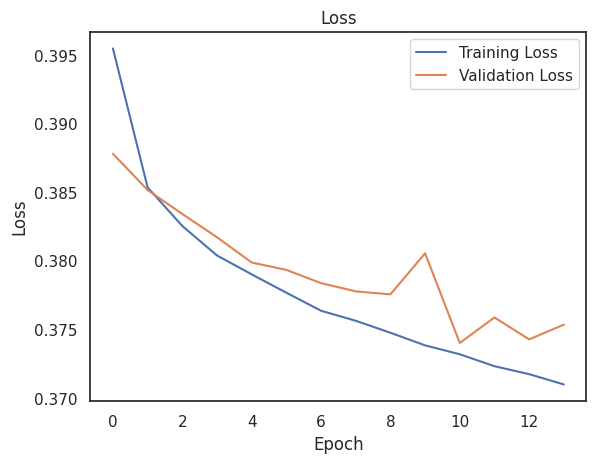

In [101]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

2618/2618 [==============================] - 9s 3ms/step


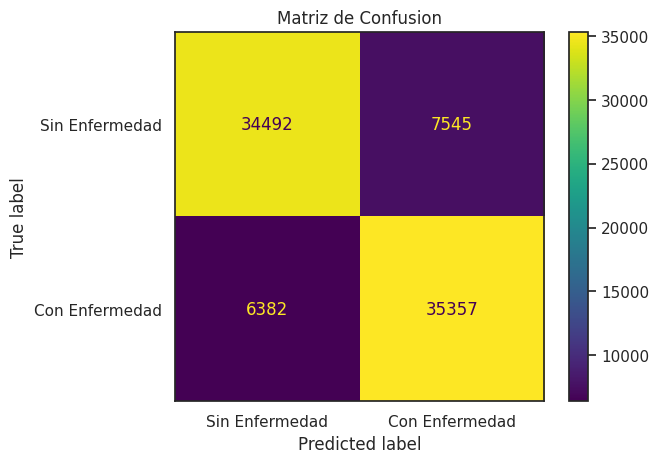

In [102]:
y_pred = (model.predict(X_test_scaled) > 0.5).astype(int)
conf_matrix = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(conf_matrix, display_labels=['Sin Enfermedad', 'Con Enfermedad'])
disp.plot()
plt.title('Matriz de Confusion')
plt.show()

### Unbalanced database

In [103]:
X = df.drop(columns=['tgt_heart_disease'])
y = df['tgt_heart_disease']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=50)
print(np.unique(y_train, return_counts=True), np.unique(y_test, return_counts=True))

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model = Sequential([
    Dense(32, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(16, activation='relu'),
    Dense(8, activation='relu'),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history = model.fit(X_train_scaled, y_train, epochs=10, validation_data=(X_test_scaled, y_test), callbacks=[early_stop], verbose=1)

(array([0, 1]), array([191277,  16731])) (array([0, 1]), array([47789,  4213]))
Epoch 1/10
6501/6501 [==============================] - 22s 3ms/step - loss: 0.2249 - accuracy: 0.9196 - val_loss: 0.2222 - val_accuracy: 0.9190
Epoch 2/10
6501/6501 [==============================] - 20s 3ms/step - loss: 0.2206 - accuracy: 0.9197 - val_loss: 0.2201 - val_accuracy: 0.9190
Epoch 3/10
6501/6501 [==============================] - 16s 2ms/step - loss: 0.2199 - accuracy: 0.9199 - val_loss: 0.2199 - val_accuracy: 0.9195
Epoch 4/10
6501/6501 [==============================] - 19s 3ms/step - loss: 0.2195 - accuracy: 0.9199 - val_loss: 0.2199 - val_accuracy: 0.9192
Epoch 5/10
6501/6501 [==============================] - 25s 4ms/step - loss: 0.2193 - accuracy: 0.9199 - val_loss: 0.2198 - val_accuracy: 0.9194
Epoch 6/10
6501/6501 [==============================] - 29s 4ms/step - loss: 0.2189 - accuracy: 0.9200 - val_loss: 0.2196 - val_accuracy: 0.9194
Epoch 7/10
6501/6501 [============================

In [104]:
train_loss, train_accuracy = model.evaluate(X_train_scaled, y_train, verbose=0)
print("Train Loss:", train_loss)
print("Train Accuracy:", train_accuracy)

test_loss, test_accuracy = model.evaluate(X_test_scaled, y_test, verbose=0)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

y_pred_prob = model.predict(X_test_scaled)

y_pred = (y_pred_prob > 0.5).astype(int)

print("\nClassification Report:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))

roc_auc = roc_auc_score(y_test, y_pred_prob)
print("ROC AUC Score:", roc_auc)

Train Loss: 0.21701058745384216
Train Accuracy: 0.9201954007148743
Test Loss: 0.21955135464668274
Test Accuracy: 0.9192531108856201
1626/1626 [==============================] - 2s 1ms/step

Classification Report:
Accuracy: 0.9192531056497827
Precision: 0.5244755244755245
Recall: 0.03560408260147164
F1 Score: 0.06668148477439431
ROC AUC Score: 0.8404262030730196


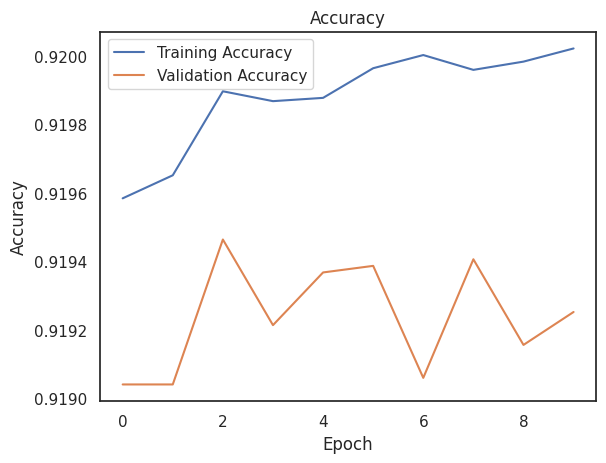

In [105]:
#Accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

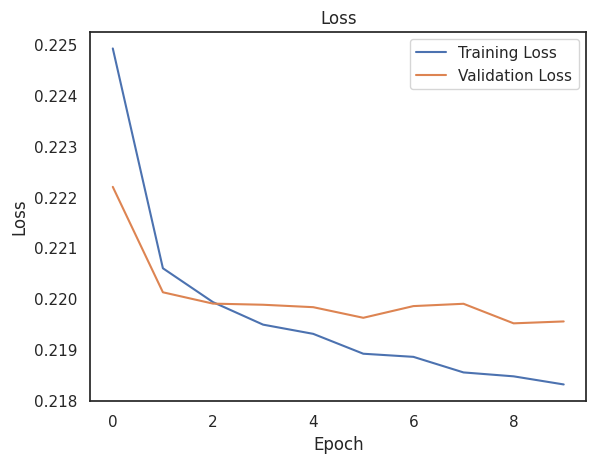

In [106]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

1626/1626 [==============================] - 2s 1ms/step


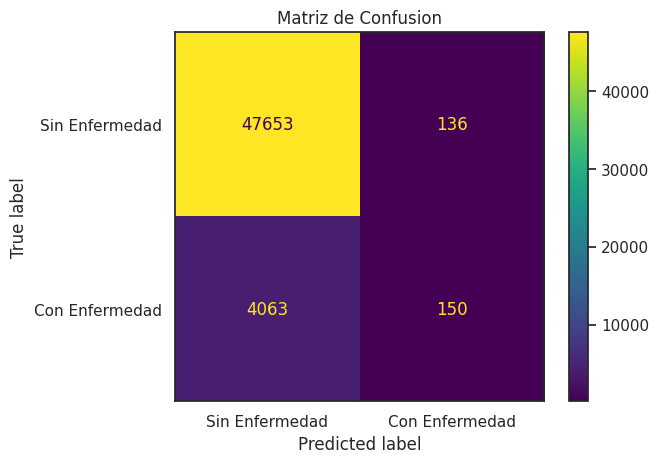

In [107]:
#Matriz de confusion

y_pred = (model.predict(X_test_scaled) > 0.5).astype(int)
conf_matrix = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(conf_matrix, display_labels=['Sin Enfermedad', 'Con Enfermedad'])
disp.plot()
plt.title('Matriz de Confusion')
plt.show()

### Variable Engineering

v_general_health	v_checkup	v_exercise	v_skin_cancer	v_other_cancer	v_depression	v_diabetes	v_arthritis	v_sex	v_age_category	c_height_(cm)	c_weight_(kg)	c_bmi	v_smoking_history	c_alcohol_consumption	c_fruit_consumption	c_green_vegetables_consumption	c_friedpotato_consumption	v_bmi_categoria	tgt_heart_disease

In [ ]:
Realizar One Hot Encoding

In [167]:
#Do one hot encoding to the following variables in the df and dfb_r bases
#v_general_health, v_checkup , v_diabetes , v_bmi_categoria

df_e=df.copy()
dfb_re=dfb_r.copy()

In [168]:
from sklearn.preprocessing import OneHotEncoder

# Initialize the OneHotEncoder
encoder = OneHotEncoder()

# Define the variables to encode and their original names
#variables_to_encode = ['v_general_health', 'v_checkup', 'v_diabetes', 'v_bmi_categoria']
variables_to_encode = ['v_diabetes','v_general_health']
original_column_names = dfb_re[variables_to_encode].columns.tolist()

# Fit and transform the encoder on dfb_r
encoded_dfb_r_array = encoder.fit_transform(dfb_re[variables_to_encode]).toarray()

# Get the generated column names
encoded_column_names = encoder.get_feature_names_out(variables_to_encode)

# Create a DataFrame from the encoded array with original column names
encoded_dfb_r = pd.DataFrame(encoded_dfb_r_array, columns=encoded_column_names)

# Map the generated column names to the original column names
column_name_mapping = dict(zip(encoded_column_names, original_column_names))
encoded_dfb_r = encoded_dfb_r.rename(columns=column_name_mapping)

# Concatenate the encoded DataFrame with the original DataFrame dfb_re
dfb_r_encoded = pd.concat([dfb_re.drop(columns=variables_to_encode), encoded_dfb_r], axis=1)

In [169]:
dfb_r_encoded.head()

,v_checkup,v_exercise,v_skin_cancer,v_other_cancer,v_depression,v_arthritis,v_sex,v_age_category,c_height_(cm),c_weight_(kg),c_bmi,v_smoking_history,c_alcohol_consumption,c_fruit_consumption,c_green_vegetables_consumption,c_friedpotato_consumption,v_bmi_categoria,tgt_heart_disease,v_diabetes,v_general_health,v_diabetes_2,v_general_health_0,v_general_health_1,v_general_health_2,v_general_health_3,v_general_health_4
0,1,0,0,0,0,0,1,11,170,85.601185,29.558534,0,0,60,25,0,3.0,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,1,0,0,0,0,0,0,10,170,63.500000,21.930000,1,3,30,16,4,2.0,1,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,1,0,0,0,1,0,0,4,168,63.050000,22.430000,1,28,0,8,16,2.0,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1,1,0,0,1,1,0,10,173,70.310000,23.570000,1,1,30,20,3,2.0,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1,0,0,0,0,0,0,2,160,47.630000,18.600000,0,0,0,1,5,2.0,0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


### Chosen one

In [170]:
X = dfb_r_encoded.drop(columns=['tgt_heart_disease'])
y = dfb_r_encoded['tgt_heart_disease']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=50)
print(np.unique(y_train, return_counts=True), np.unique(y_test, return_counts=True))

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model = Sequential([
    Dense(32, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(16, activation='relu'),
    Dense(8, activation='relu'),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history = model.fit(X_train_scaled, y_train, epochs=10, validation_data=(X_test_scaled, y_test), callbacks=[early_stop], verbose=1)

(array([0, 1]), array([167403, 167701])) (array([0, 1]), array([42037, 41739]))
Epoch 1/10
10472/10472 [==============================] - 33s 3ms/step - loss: 0.3954 - accuracy: 0.8219 - val_loss: 0.3876 - val_accuracy: 0.8271
Epoch 2/10
10472/10472 [==============================] - 27s 3ms/step - loss: 0.3851 - accuracy: 0.8277 - val_loss: 0.3843 - val_accuracy: 0.8287
Epoch 3/10
10472/10472 [==============================] - 28s 3ms/step - loss: 0.3825 - accuracy: 0.8290 - val_loss: 0.3827 - val_accuracy: 0.8297
Epoch 4/10
10472/10472 [==============================] - 26s 3ms/step - loss: 0.3809 - accuracy: 0.8301 - val_loss: 0.3822 - val_accuracy: 0.8302
Epoch 5/10
10472/10472 [==============================] - 27s 3ms/step - loss: 0.3795 - accuracy: 0.8306 - val_loss: 0.3825 - val_accuracy: 0.8303
Epoch 6/10
10472/10472 [==============================] - 36s 3ms/step - loss: 0.3784 - accuracy: 0.8311 - val_loss: 0.3795 - val_accuracy: 0.8321
Epoch 7/10
10472/10472 [==============

In [171]:
train_loss, train_accuracy = model.evaluate(X_train_scaled, y_train, verbose=0)
print("Train Loss:", train_loss)
print("Train Accuracy:", train_accuracy)

test_loss, test_accuracy = model.evaluate(X_test_scaled, y_test, verbose=0)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

y_pred_prob = model.predict(X_test_scaled)

y_pred = (y_pred_prob > 0.5).astype(int)

print("\nClassification Report:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))

roc_auc = roc_auc_score(y_test, y_pred_prob)
print("ROC AUC Score:", roc_auc)

Train Loss: 0.3722657263278961
Train Accuracy: 0.834221601486206
Test Loss: 0.3764391541481018
Test Accuracy: 0.8329592943191528
2618/2618 [==============================] - 5s 2ms/step

Classification Report:
Accuracy: 0.8329593200916731
Precision: 0.8206847130076979
Recall: 0.8505714080356501
F1 Score: 0.835360832019577
ROC AUC Score: 0.9114812025667353


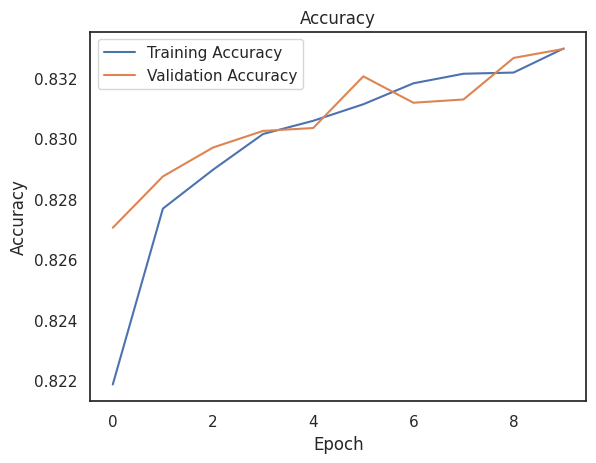

In [172]:
#Accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

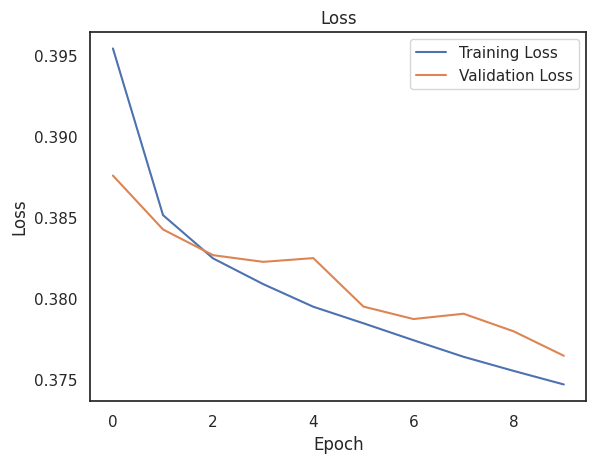

In [173]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

2618/2618 [==============================] - 9s 4ms/step


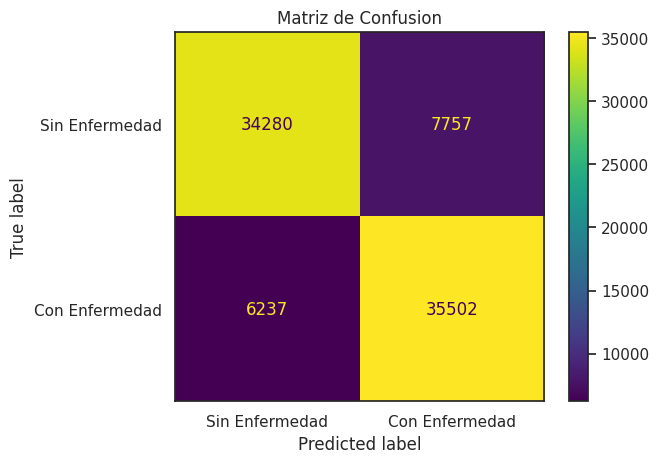

In [175]:
#Confusion Matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
y_pred = (model.predict(X_test_scaled) > 0.5).astype(int)
conf_matrix = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(conf_matrix, display_labels=['Sin Enfermedad', 'Con Enfermedad'])
disp.plot()
plt.title('Matriz de Confusion')
plt.show()

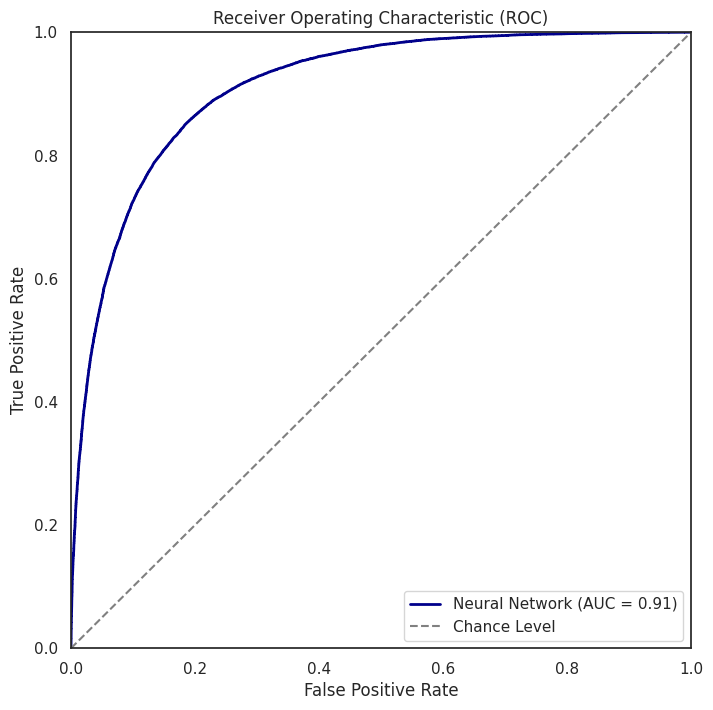

In [178]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# ROC curve and AUC
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

# ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkblue', lw=2, label='Neural Network (AUC = %0.2f)' % roc_auc)

#Diagonal line
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Chance Level')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')

plt.show()

## Sources

In [ ]:
#Data comes from the Behavioral Risk Factor Surveillance System (BRFSS) data set
#which was collected from the Centers for Disease Control and Prevention (CDC).
#https://www.cdc.gov/brfss/annual_data/annual_2021.html
#https://www.kaggle.com/datasets/alphiree/cardiovascular-diseases-risk-prediction-dataset